In [21]:
import numpy as np
import  matplotlib.pyplot as plt

In [22]:
def source(no_of_users, no_of_bits,rnd_seed):
    np.random.seed(rnd_seed)
    # Generate a random binary matrix with shape (no_of_users, no_of_bits)
    # Each element is either 0 or 1
    return np.random.randint(0, 2, (no_of_users, no_of_bits))

In [23]:
def mod(bits):
    # Map binary values: 0 to -1 and 1 to 1
    return 2 * bits - 1

In [24]:
def awgn_mac_with_channel_coeff(symbols, snr_db,no_of_users,no_of_bits,rnd_seed):
    # Sum the columns of the symbols array to combine signals from different users
    #cahnnel coefficienst
    np.random.seed(rnd_seed)
    channel_coeff=np.random.randn(no_of_users,no_of_bits)
    print("chann coeff:\n",channel_coeff)
    faded_symbols=symbols*channel_coeff# This corresponds to y = x_i * h_i
    # Print combined symbols for debugging (commented out)
    combined_faded_symbols = np.sum(faded_symbols, axis=0)# This corresponds to y = ∑x_i * h_i
    print("combined_symbols:\n",combined_faded_symbols)   
    # Calculate the average power of the combined signal
    signal_power = np.mean(np.abs(combined_faded_symbols)**2)  # Signal power calculation
    #Convert SNR from dB to linear scale
    snr_linear = 10**(snr_db / 10.0)
    # Calculate noise variance based on the signal power and SNR
    noise_variance = signal_power / (2 * snr_linear)
    # Generate complex Gaussian noise with the calculated variance
    noise = np.sqrt(noise_variance) * np.random.randn(len(combined_faded_symbols))  # Generating noise with accordance with signal power
    print("noise:\n",noise)
    #multiplying with channel coeff
    # channel_coeff=np.random.randn(len(combined_symbols))
    # Add the noise to the combined symbols and return the result
    return combined_faded_symbols + noise,channel_coeff

# ch_op=awgn_mac_with_channel_coeff([[-1],[1]],1,2,4)
# print(ch_op)

In [25]:
def demod(received_signal,channel_coeff):
    print("received:\n",received_signal,"\n")
    print("+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++")
    possible_symbols=[(-1,-1),(-1,1),(1,-1),(1,1)]
    # print("channel_coeff\n",channel_coeff,"\n\n")
    recovered_sum=[]
    best_symbol = None  # To keep track of the symbol with the minimum distance
    for i in range(0,len(channel_coeff[0])):
        min_distance = float('inf')  # Initialize min_distance to a large value
        for j in range(0,len(possible_symbols)):
            print(f"ch_coef[{i}]=",channel_coeff[:,i],"\tsymbol:",np.array(possible_symbols[j]))
            hi_xi=channel_coeff[:,i]*np.array(possible_symbols[j])
            sum_hi_xi=np.sum(hi_xi)
            print("∑x_i*h_i=",sum_hi_xi,"\t","y=",received_signal[i])
            distance=np.abs(received_signal[i]-sum_hi_xi)**2
            print("distance=",distance,"\n\n")
            # Update the minimum distance and corresponding symbol
            if distance < min_distance:
                min_distance = distance
                best_symbol =np.sum(possible_symbols[j])
        print("min_distance:",min_distance,"best_symb:",best_symbol)    
        print("---------------------------------------------------------------------")
        recovered_sum.append(np.sum(best_symbol))
    return recovered_sum

# ch=np.array([[1,-1],[0,1]])
# dmd_syb=demod([-2,2],ch)
# print("demodulated symbols",dmd_syb)

In [26]:
def ber_bpsk_sum_with_fading(msg, recovered,rnd_seed):
    np.random.seed(rnd_seed)
    # Modulate the original message bits to get the transmitted symbols
    sym1 =mod(msg)
    # Sum the transmitted symbols across all users
    combined_symbols = np.sum(sym1, axis=0)  # This is used to compare with the received symbols
    print("msg:",combined_symbols)
    print("rec:",np.array(recovered))
    # Calculate the Bit Error Rate (BER) by comparing the combined transmitted symbols with the received symbols
    ber = np.mean(combined_symbols != recovered)  # BER is calculated by averaging the number of symbol errors
    return ber


In [27]:
#Function to simulate the system for different SNR values
def simulate_mac_with_fading(snr_db_range,no_of_users,no_of_bits,rnd_seed):
    
    ber_with_channel_coeff = []  # Initialize an empty list to store Symbol Error Rate (SER) for each SNR value
    # Iterate over the range of SNR values
    for snr_db in snr_db_range:
        # Print the current SNR value for debugging (commented out)
        # print("snr=", snr_db) 
        msg_bits = source(no_of_users, no_of_bits,rnd_seed) # Generating bit stream of size (no_of_users, no_of_bits)     
        print("msg_bits:\n",msg_bits)
        # Modulate the message bits to obtain transmitted symbols
        transmitted_symbols = mod(msg_bits)  # Modulation: bit stream --> symbols
        print("symbols:\n",transmitted_symbols)         
        # Pass the transmitted symbols through the AWGN channel to get received symbols
        received_symbols,faded_symbols = awgn_mac_with_channel_coeff(transmitted_symbols, snr_db,no_of_users,no_of_bits,rnd_seed)  # Received symbols: channel output = symbols + noise
        # print("received\n",received_symbols)       
        # Demodulate the received symbols to recover the transmitted symbols
        demodulated_symbols = demod(received_symbols,faded_symbols)  # Demodulation: noisy_symbols --> decoded symbols
        # print("demodulated\n",demodulated_symbols)    
        # ber_with_channel_coeff=ber_bpsk_sum_with_fading(msg_bits,demodulated_symbols)
        # print(ber_with_channel_coeff)
        ber_with_channel_coeff.append(ber_bpsk_sum_with_fading(msg_bits, demodulated_symbols,rnd_seed)) 
        # Demodulate the received symbols to recover the transmitted symbo>
        # print("\n\n")
    return ber_with_channel_coeff   # Return the list of SER values for the given range of SNR values

In [28]:
# Define the range of SNR values (in dB) for the simulation
snr_db_range =np.arange(1, 12, 2)  # Input for SNR range to plot
# Run the simulation to obtain SER for each SNR value

no_of_users = 2  # Define the number of users
no_of_bits =2000  # Define the number of bits per user
# Generate the message bits as a binary matrix

rnd_seed=None

In [29]:
ber_bpsk_sum_with_fading=simulate_mac_with_fading(snr_db_range,no_of_users,no_of_bits,rnd_seed)
# Print the Bit Error Rate (BER) for each SNR value
# print(ber_bpsk_sum_with_channel_coeff) 
print("BER",ber_bpsk_sum_with_fading)

msg_bits:
 [[0 1 1 ... 1 1 0]
 [1 1 1 ... 0 0 1]]
symbols:
 [[-1  1  1 ...  1  1 -1]
 [ 1  1  1 ... -1 -1  1]]
chann coeff:
 [[ 1.19488632  0.19742494 -0.6447425  ... -0.70869224  1.1140904
   1.74713172]
 [ 1.45999567 -0.73763221  0.42494462 ... -1.17707135 -0.95334783
   2.21522326]]
combined_symbols:
 [ 0.26510935 -0.54020727 -0.21979788 ...  0.46837911  2.06743823
  0.46809154]
noise:
 [-1.45153498 -0.80631066  1.42310288 ...  0.25009505  1.33001598
  0.17552743]
received:
 [-1.18642563 -1.34651793  1.203305   ...  0.71847416  3.39745421
  0.64361897] 

+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
ch_coef[0]= [1.19488632 1.45999567] 	symbol: [-1 -1]
∑x_i*h_i= -2.6548819884275066 	 y= -1.1864256315690047
distance= 2.156364071998144 


ch_coef[0]= [1.19488632 1.45999567] 	symbol: [-1  1]
∑x_i*h_i= 0.26510934560448773 	 y= -1.1864256315690047
distance= 2.1069537899580513 


ch_coef[0]= [1.19488632 1.45999567] 	symbol: [ 1 -1]
∑x_i*h_i= -0.26510934560448773 	 y= -1

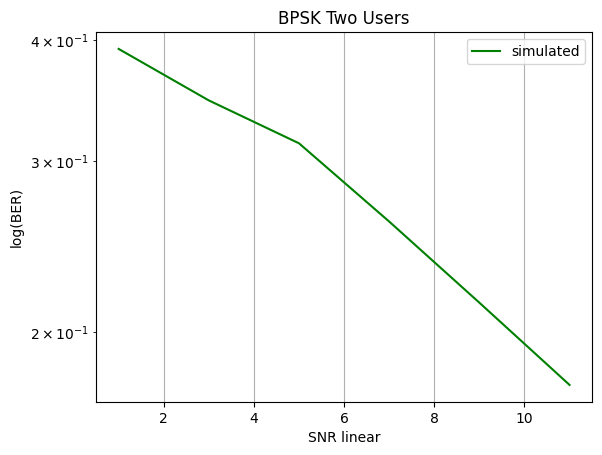

In [30]:
# Convert SNR values from dB to linear scale
snr_lin = 10**(snr_db_range / 10)  # SNR in linear scale
# Plot the simulated BER values
plt.semilogy(snr_db_range, ber_bpsk_sum_with_fading, linestyle='-', color="g", label='simulated')
#theoritical values
# plt.semilogy(snr_db_range,1/((1*snr_db_range)), linestyle='--', color="r", label='theoritical')
plt.xlabel("SNR linear")  
plt.ylabel("log(BER)")       
plt.legend()         
plt.title("BPSK Two Users") 
plt.grid(True)
plt.show()